Welcome to my notebook! This is a copy/paste welcome message for all my notebooks :) 📓 This repository/notebook serves as a personal reminder for me, documenting code snippets and techniques sourced from various learning resources. The goal is to consolidate valuable information and create a basic reference guide. Please note that the codes included here are not originally mine, and credit goes to the respective authors and resources. Feel free to explore and use this collection as a shared learning space. Happy coding

#### Sources for this notebook : 
    * https://huggingface.co/blog/stable_diffusion#how-does-stable-diffusion-work
    * https://github.com/huggingface/blog/blob/main/stable_diffusion.md
    
    
#### Purpose :
    * Understanding Stable diffusion by huggingface diffuser library
    
#### Keywords :
    * Stable Diffusion
    * Diffusers library

'' Stable Diffusion is a text-to-image latent diffusion model created by the researchers and engineers from CompVis, Stability AI and LAION. It is trained on 512x512 images from a subset of the LAION-5B database. LAION-5B is the largest, freely accessible multi-modal dataset that currently exists.''

If you don't have any knowledge about diffusion models and how they work, you can check my other notebooks. This notebook contains basic steps for Stable Diffusion models by using diffusers library.

"Note: If you are limited by GPU memory and have less than 10GB of GPU RAM available, please make sure to load the StableDiffusionPipeline in float16 precision instead of the default float32 precision as done above.

You can do so by loading the weights from the fp16 branch and by telling diffusers to expect the weights to be in float16 precision:"

you just need 4 lines to prepare a stable diffusion pipeline...

In [1]:
import torch
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16)
pipe.to("cuda")

C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
model_index.json: 100%|██████████| 543/543 [00:00<00:00, 181kB/s]
C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\pipelines\pipeline_utils.py:270: FutureWarning: You are loading the variant fp16 from CompVis/stable-diffusion-v1-4 via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.26.2",
  "_name_or_path": "CompVis/stable-diffusion-v1-4",
  "feature_extractor": [
    "transformers",
    "CLIPFeatureExtractor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

Your pipeline is ready. You can write a prompt and send it to pipeline. Then your first image is ready.

In [2]:
prompt = "a photograph of an astronaut riding a horse"

output of pipeline contains two variables. One of them image/images, other one is the safety check of images. Safety check returns boolean. If image is not suitable, it returns a black image.

In [3]:
result = pipe(prompt)


  0%|          | 0/50 [00:00<?, ?it/s]C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\models\attention_processor.py:1244: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  hidden_states = F.scaled_dot_product_attention(
100%|██████████| 50/50 [00:09<00:00,  5.17it/s]


In [4]:
print(result)

StableDiffusionPipelineOutput(images=[<PIL.Image.Image image mode=RGB size=512x512 at 0x1F72C8BC9D0>], nsfw_content_detected=[False])


In [6]:
result[0]

[<PIL.Image.Image image mode=RGB size=512x512>]

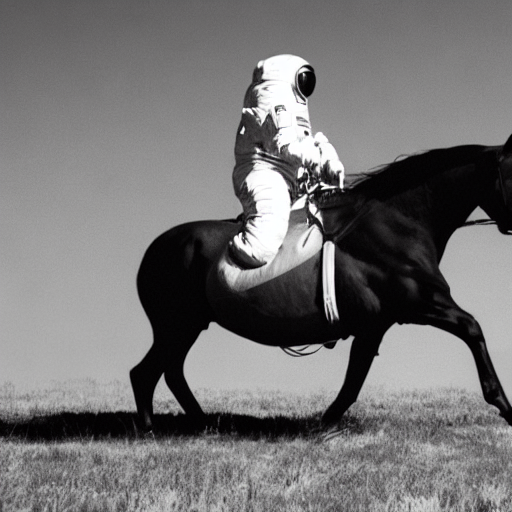

In [7]:
result[0][0]

In [8]:
result[1]

[False]

#### Seed for deterministic results

'' If you want deterministic output you can seed a random seed and pass a generator to the pipeline. Every time you use a generator with the same seed you'll get the same image output.''

In [9]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)
image = pipe(prompt, guidance_scale=7.5, generator=generator).images[0]

100%|██████████| 50/50 [00:08<00:00,  5.95it/s]


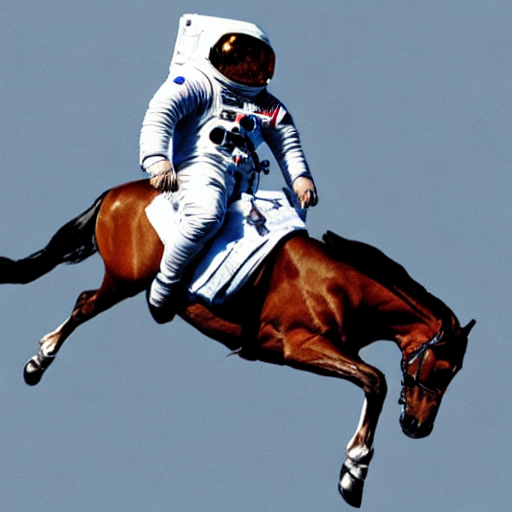

In [10]:
image

Because of seed, this image will always be same with same command.

#### Inference number

 You can change the number of inference steps using 'num_inference_steps' argument. Generally , more steps are better for high quality images, but it needs more time.
 Importance and function of inference step number will be explained another notebook.

In [13]:
import torch
generator = torch.Generator("cuda").manual_seed(1024)
image = pipe(prompt, guidance_scale=7.5, num_inference_steps=15, generator=generator).images[0]

100%|██████████| 15/15 [00:03<00:00,  4.91it/s]


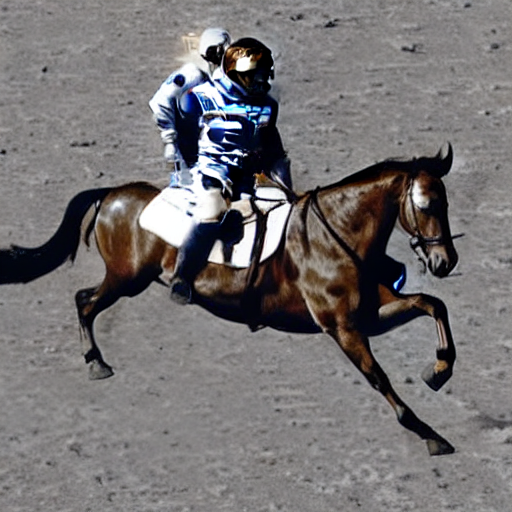

In [14]:
image

#### Guidance_scale

other argument is 'guidance_scale'. In simple terms forces the generation to better match the prompt potentially at the cost of image quality or diversity
If you use a very large value the images might look good, but will be less diverse.

#### Generating more images with same prompt

First prepare a function to show all image at once

In [17]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid


##### Method_1

In [18]:
num_images = 3
prompt = ["a photograph of an astronaut riding a horse"] * num_images

images = pipe(prompt).images

grid = image_grid(images, rows=1, cols=3)

# you can save the grid with
# grid.save(f"astronaut_rides_horse.png")


100%|██████████| 50/50 [00:20<00:00,  2.49it/s]


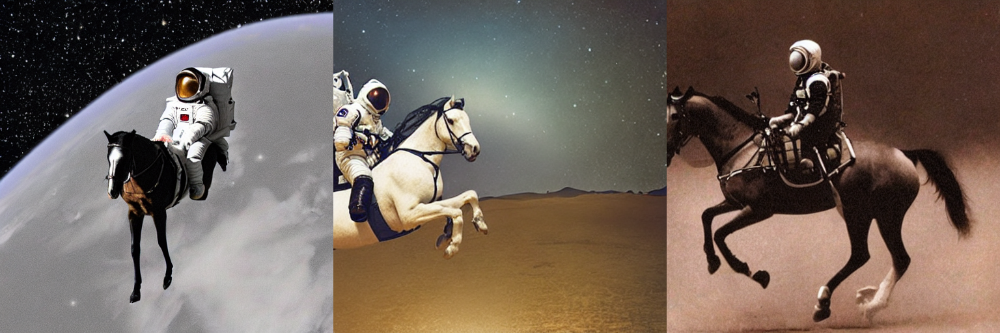

In [19]:
grid

But I think using one argument from pipeline would be easier option for generating more images with one prompt

##### Method_2

In [20]:
results = pipe(prompt,num_images_per_prompt=3)

100%|██████████| 50/50 [00:56<00:00,  1.13s/it]


In [21]:
results

StableDiffusionPipelineOutput(images=[<PIL.Image.Image image mode=RGB size=512x512 at 0x1F7F62EAE20>, <PIL.Image.Image image mode=RGB size=512x512 at 0x1F7F62EAD90>, <PIL.Image.Image image mode=RGB size=512x512 at 0x1F7F62EA430>, <PIL.Image.Image image mode=RGB size=512x512 at 0x1F7F62EACA0>, <PIL.Image.Image image mode=RGB size=512x512 at 0x1F7F62EA850>, <PIL.Image.Image image mode=RGB size=512x512 at 0x1F7F62EAF10>, <PIL.Image.Image image mode=RGB size=512x512 at 0x1F7F62EADF0>, <PIL.Image.Image image mode=RGB size=512x512 at 0x1F7F62EA760>, <PIL.Image.Image image mode=RGB size=512x512 at 0x1F7F62EA400>], nsfw_content_detected=[False, False, False, False, False, False, False, False, False])

In [22]:
grid = image_grid(results[0], rows=3, cols=3)

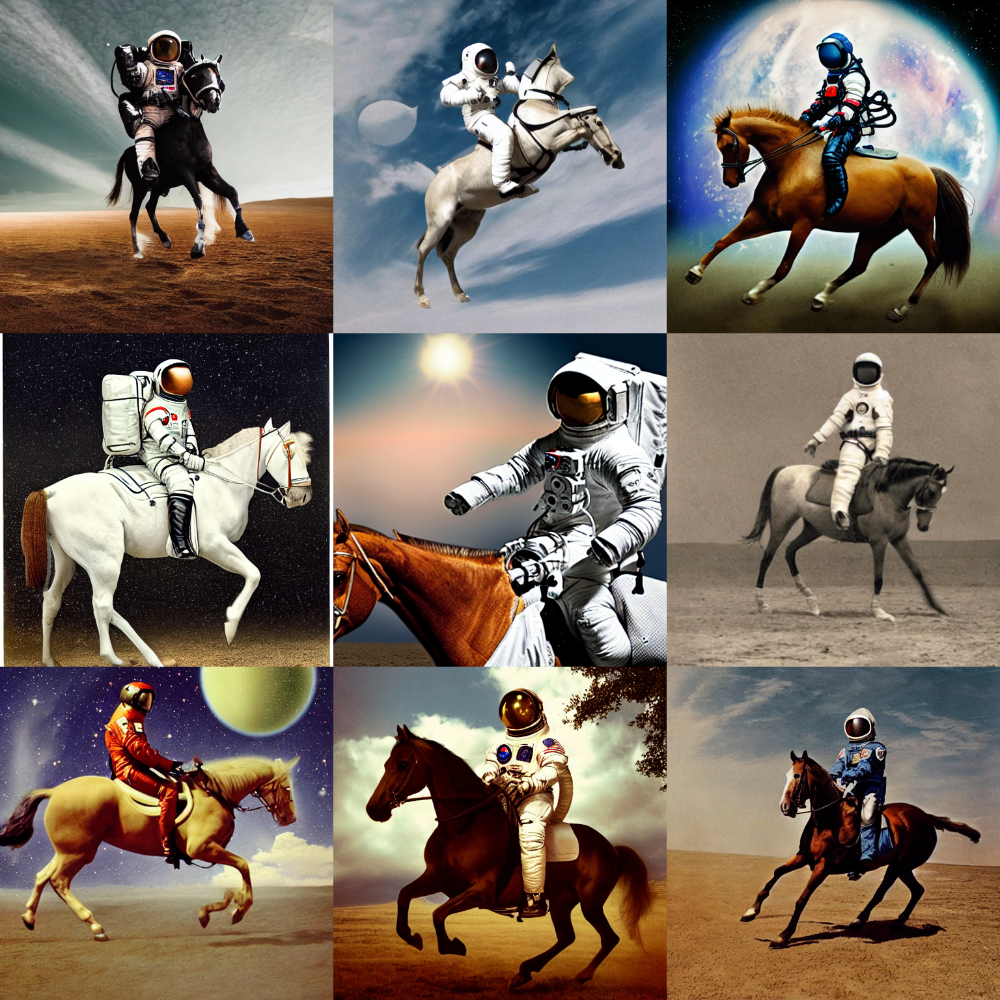

In [23]:
grid

I used the same prompt with resource and it is multiplied with 3.... so by using 'num_images_per_prompt'=3 ,we create 9 images. If I had used a prompt, because of the argument it would return 3 images

#### Image size

By default, stable diffusion produces images of 512 × 512 pixels. It's very easy to override the default using the height and width arguments to create rectangular images in portrait or landscape ratios.

In [24]:
prompt = "a photograph of an astronaut riding a horse"
image = pipe(prompt, height=512, width=768).images[0]

100%|██████████| 50/50 [00:20<00:00,  2.50it/s]


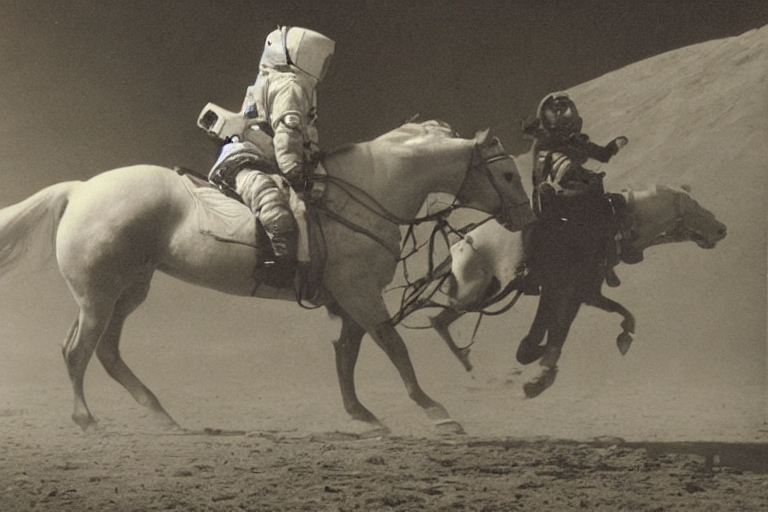

In [25]:
image

'' Going over 512 in both directions will repeat image areas (global coherence is lost)!!! ''

## How does Stable Diffusion work?

We understand how to use diffusers to create image with Stable Diffusion Model. Time to understand 'how they work'.

Stable Diffusion is based on a particular type of diffusion model called Latent Diffusion. I assume that we know the theory of diffusion models.

Generally speaking, diffusion models are machine learning systems that are trained to denoise random Gaussian noise step by step, to get to a sample of interest, such as an image.

'' One downside of diffusion models is that the reverse denoising process is slow because of its repeated, sequential nature. In addition, these models consume a lot of memory because they operate in pixel space, which becomes huge when generating high-resolution images. Therefore, it is challenging to train these models and also use them for inference.

Latent diffusion can reduce the memory and compute complexity by applying the diffusion process over a lower dimensional latent space, instead of using the actual pixel space. This is the key difference between standard diffusion and latent diffusion models: in latent diffusion the model is trained to generate latent (compressed) representations of the images.'' 



There are 3 main components in latent diffusion. I don't dive deep here, so just a review sentence for each one : 

    * Autoencoder (VAE) : denoised latents generated by the reverse diffusion process are converted back into images using VAE decoder.

    * U-Net : Predict denoised image representation 

    * Text-encoder : Transform input prompt into an embedding space

Another important consept is Scheduler. Basically, they compute the predicted denoised image representation from the previous noise representation and the predicted noise residual.

### Own inference pipeline

Before we just choose a stable diffusion model name and doesn't care rest. Now let's load each components and see their outputs and effects

Above we created image with just 6 lines of codes. Now we try to see all of steps which returns image.

In [1]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

# 1. Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [2]:
import scipy

define scheduler

In [3]:
from diffusers import LMSDiscreteScheduler

scheduler = LMSDiscreteScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")

scheduler/scheduler_config.json: 100%|██████████| 313/313 [00:00<00:00, 157kB/s]


In [4]:
vae

AutoencoderKL(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
        )
        (downsamplers): ModuleList(
          (0): Downsample2D(
            (conv): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(2, 2))
          )
        )
      )
      (1): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 128, ep

In [5]:
unet

UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): LoRACompatibleLinear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): LoRACompatibleLinear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): LoRACompatibleConv(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): LoRACompatibleLinear(in_features=320, out_features=320, bias=False)
                (to_k): LoRACompatibleLinear(in_features=320, out_features=320

In [6]:
tokenizer

CLIPTokenizer(name_or_path='openai/clip-vit-large-patch14', vocab_size=49408, model_max_length=77, is_fast=False, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<|startoftext|>', 'eos_token': '<|endoftext|>', 'unk_token': '<|endoftext|>', 'pad_token': '<|endoftext|>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	49406: AddedToken("<|startoftext|>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	49407: AddedToken("<|endoftext|>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
}

In [7]:
text_encoder

CLIPTextModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e

In [9]:
import torch
torch_device = "cuda"
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device) 

In [10]:
prompt = ["a photograph of an astronaut riding a horse"]

height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion

num_inference_steps = 100            # Number of denoising steps

guidance_scale = 7.5                # Scale for classifier-free guidance

generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise

batch_size = 1

We will take text_embeddings...

In [11]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")



In [12]:
text_input

{'input_ids': tensor([[49406,   320,  8853,   539,   550, 18376,  6765,   320,  4558, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

In [13]:
with torch.no_grad():
  text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

In [14]:
text_embeddings

tensor([[[-0.3884,  0.0229, -0.0522,  ..., -0.4899, -0.3066,  0.0675],
         [ 0.0290, -1.3258,  0.3085,  ..., -0.5257,  0.9768,  0.6652],
         [ 0.4595,  0.5617,  1.6663,  ..., -1.9515, -1.2307,  0.0104],
         ...,
         [-3.0421, -0.0656, -0.1793,  ...,  0.3943, -0.0190,  0.7664],
         [-3.0551, -0.1036, -0.1936,  ...,  0.4236, -0.0190,  0.7575],
         [-2.9854, -0.0832, -0.1715,  ...,  0.4355,  0.0095,  0.7485]]],
       device='cuda:0')

In [15]:
text_embeddings.shape

torch.Size([1, 77, 768])

If you check the model structure, this output shape is not a surprise

In [16]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
  uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 

In [17]:
uncond_embeddings

tensor([[[-0.3884,  0.0229, -0.0522,  ..., -0.4899, -0.3066,  0.0675],
         [-0.3711, -1.4497, -0.3401,  ...,  0.9489,  0.1867, -1.1034],
         [-0.5107, -1.4629, -0.2926,  ...,  1.0419,  0.0701, -1.0284],
         ...,
         [ 0.5006, -0.9552, -0.6610,  ...,  1.6013, -1.0622, -0.2191],
         [ 0.4988, -0.9451, -0.6656,  ...,  1.6467, -1.0858, -0.2088],
         [ 0.4923, -0.8124, -0.4912,  ...,  1.6108, -1.0174, -0.2484]]],
       device='cuda:0')

In [18]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

initial random noise for latents...

In [19]:
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)

C:\Users\Zeki\AppData\Local\Temp\ipykernel_13956\599285976.py:2: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


In [20]:
latents

tensor([[[[-1.7416, -0.3635,  0.9803,  ..., -0.0835, -0.5678,  0.2669],
          [ 0.0671,  0.1321, -0.6149,  ...,  0.9348, -1.1235,  0.2869],
          [ 0.1907, -2.3818,  1.4573,  ...,  1.1344, -0.2267, -0.4753],
          ...,
          [ 0.0417, -1.8682, -0.7625,  ...,  0.4973, -0.1705,  1.3066],
          [ 0.5290, -0.1080, -2.1661,  ..., -0.3600, -0.3357,  1.2910],
          [ 0.7241, -0.3273, -0.3932,  ..., -0.4363, -0.5686,  0.2259]],

         [[-0.2386, -0.0577, -0.3119,  ...,  1.8806,  0.7451, -0.3967],
          [-1.3491,  0.1298,  1.6819,  ...,  0.9758,  0.0105,  0.4941],
          [ 0.2685,  1.3332,  1.0956,  ...,  0.2491,  0.0675,  0.9570],
          ...,
          [-0.4114,  0.2354, -0.4764,  ..., -1.8345,  0.5142, -0.4897],
          [-1.1576,  1.0628,  0.7311,  ..., -1.7873,  0.2037,  1.3463],
          [ 0.6353,  1.5984, -0.7635,  ..., -0.8224, -0.9567, -0.3518]],

         [[-1.0166,  1.0727,  1.1369,  ..., -0.3767,  0.3852, -0.1230],
          [-0.3895, -0.8134, -

In [21]:
latents.shape

torch.Size([1, 4, 64, 64])

In [22]:
latents = latents.to(torch_device)

In [23]:
latents

tensor([[[[-1.7416, -0.3635,  0.9803,  ..., -0.0835, -0.5678,  0.2669],
          [ 0.0671,  0.1321, -0.6149,  ...,  0.9348, -1.1235,  0.2869],
          [ 0.1907, -2.3818,  1.4573,  ...,  1.1344, -0.2267, -0.4753],
          ...,
          [ 0.0417, -1.8682, -0.7625,  ...,  0.4973, -0.1705,  1.3066],
          [ 0.5290, -0.1080, -2.1661,  ..., -0.3600, -0.3357,  1.2910],
          [ 0.7241, -0.3273, -0.3932,  ..., -0.4363, -0.5686,  0.2259]],

         [[-0.2386, -0.0577, -0.3119,  ...,  1.8806,  0.7451, -0.3967],
          [-1.3491,  0.1298,  1.6819,  ...,  0.9758,  0.0105,  0.4941],
          [ 0.2685,  1.3332,  1.0956,  ...,  0.2491,  0.0675,  0.9570],
          ...,
          [-0.4114,  0.2354, -0.4764,  ..., -1.8345,  0.5142, -0.4897],
          [-1.1576,  1.0628,  0.7311,  ..., -1.7873,  0.2037,  1.3463],
          [ 0.6353,  1.5984, -0.7635,  ..., -0.8224, -0.9567, -0.3518]],

         [[-1.0166,  1.0727,  1.1369,  ..., -0.3767,  0.3852, -0.1230],
          [-0.3895, -0.8134, -

In [24]:
scheduler

LMSDiscreteScheduler {
  "_class_name": "LMSDiscreteScheduler",
  "_diffusers_version": "0.26.2",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "timestep_spacing": "linspace",
  "trained_betas": null,
  "use_karras_sigmas": false
}

In [25]:
scheduler.set_timesteps(num_inference_steps)

In [26]:
scheduler

LMSDiscreteScheduler {
  "_class_name": "LMSDiscreteScheduler",
  "_diffusers_version": "0.26.2",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "timestep_spacing": "linspace",
  "trained_betas": null,
  "use_karras_sigmas": false
}

In [27]:
latents = latents * scheduler.init_noise_sigma

In [29]:
scheduler.init_noise_sigma

tensor(14.6146)

denoising loop...

In [30]:
from tqdm.auto import tqdm

scheduler.set_timesteps(num_inference_steps)

for t in tqdm(scheduler.timesteps):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)

    latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample


  0%|          | 0/100 [00:00<?, ?it/s]C:\Users\Zeki\anaconda3\envs\stable_diff\lib\site-packages\diffusers\models\attention_processor.py:1244: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  hidden_states = F.scaled_dot_product_attention(
100%|██████████| 100/100 [00:50<00:00,  1.97it/s]


In [31]:
latents

tensor([[[[ 0.1443,  0.1276,  0.3736,  ...,  1.4240,  1.3549,  1.5302],
          [ 0.2099,  0.4004,  0.4883,  ...,  1.5691,  0.8217,  1.1581],
          [ 0.3087,  0.3029,  0.6239,  ...,  1.5139,  1.0725,  0.6380],
          ...,
          [-0.4126, -2.0406, -0.4092,  ...,  1.1027,  0.9181,  0.6566],
          [ 0.3164, -0.4968, -2.1311,  ...,  0.8513,  0.7917,  0.5891],
          [ 0.5101, -1.2700, -0.6719,  ...,  0.3021,  0.4192, -0.1036]],

         [[-1.1357, -1.2380, -1.2344,  ...,  1.4335,  0.8712,  0.6414],
          [-1.1601, -1.3409, -1.1709,  ...,  0.7357,  0.2491,  0.3542],
          [-1.0559, -1.1113, -1.0460,  ..., -0.1511,  0.2316,  0.1363],
          ...,
          [-0.5891,  0.2396, -0.8962,  ..., -0.7283, -0.6215, -0.7596],
          [-1.3458,  0.9489, -0.7851,  ..., -0.5586, -0.5920, -0.6123],
          [ 0.1808,  0.9837, -1.6348,  ..., -0.5721, -0.4773, -0.7338]],

         [[-0.2359,  0.2747,  0.2162,  ..., -1.0795, -1.1094, -0.9633],
          [-0.1104,  0.1443,  

By using VAE, latents will be denoised image...

In [32]:
# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents
with torch.no_grad():
    image = vae.decode(latents).sample


In [33]:
image

tensor([[[[-0.1512, -0.1475, -0.1447,  ...,  0.8659,  0.8537,  0.8151],
          [-0.1427, -0.1363, -0.1396,  ...,  0.8628,  0.8773,  0.8795],
          [-0.1347, -0.1284, -0.1246,  ...,  0.8577,  0.8645,  0.8827],
          ...,
          [ 0.2169,  0.6510,  0.6154,  ...,  0.0813,  0.0897,  0.0792],
          [ 0.1942,  0.5508,  0.4488,  ...,  0.1082,  0.1075,  0.0856],
          [ 0.0663,  0.3829,  0.4568,  ...,  0.0982,  0.0788,  0.0045]],

         [[-0.3448, -0.3671, -0.3803,  ...,  0.4245,  0.4163,  0.4681],
          [-0.3670, -0.3776, -0.3764,  ...,  0.3975,  0.3906,  0.4167],
          [-0.3749, -0.3723, -0.3613,  ...,  0.3875,  0.3812,  0.3999],
          ...,
          [-0.2310,  0.1412,  0.1720,  ..., -0.6497, -0.6692, -0.6704],
          [-0.1798,  0.0777,  0.0169,  ..., -0.6644, -0.6548, -0.6587],
          [-0.2584,  0.0096,  0.0953,  ..., -0.6520, -0.6576, -0.6105]],

         [[-0.2073, -0.1810, -0.1665,  ...,  0.2161,  0.2328,  0.2621],
          [-0.1634, -0.1570, -

In [34]:
image.shape

torch.Size([1, 3, 512, 512])

In [35]:
image = (image / 2 + 0.5).clamp(0, 1)



In [36]:
image

tensor([[[[0.4244, 0.4262, 0.4276,  ..., 0.9329, 0.9268, 0.9075],
          [0.4287, 0.4318, 0.4302,  ..., 0.9314, 0.9387, 0.9397],
          [0.4326, 0.4358, 0.4377,  ..., 0.9288, 0.9322, 0.9413],
          ...,
          [0.6085, 0.8255, 0.8077,  ..., 0.5406, 0.5449, 0.5396],
          [0.5971, 0.7754, 0.7244,  ..., 0.5541, 0.5538, 0.5428],
          [0.5332, 0.6914, 0.7284,  ..., 0.5491, 0.5394, 0.5023]],

         [[0.3276, 0.3165, 0.3099,  ..., 0.7122, 0.7081, 0.7341],
          [0.3165, 0.3112, 0.3118,  ..., 0.6988, 0.6953, 0.7084],
          [0.3125, 0.3139, 0.3194,  ..., 0.6938, 0.6906, 0.6999],
          ...,
          [0.3845, 0.5706, 0.5860,  ..., 0.1751, 0.1654, 0.1648],
          [0.4101, 0.5388, 0.5085,  ..., 0.1678, 0.1726, 0.1706],
          [0.3708, 0.5048, 0.5476,  ..., 0.1740, 0.1712, 0.1947]],

         [[0.3963, 0.4095, 0.4167,  ..., 0.6080, 0.6164, 0.6310],
          [0.4183, 0.4215, 0.4282,  ..., 0.6159, 0.6145, 0.6082],
          [0.4159, 0.4239, 0.4304,  ..., 0

In [ ]:
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()

In [39]:
image.shape

(1, 512, 512, 3)

In [40]:
image

array([[[[0.42439097, 0.3276068 , 0.3963478 ],
         [0.42623442, 0.31645668, 0.40949088],
         [0.42763662, 0.30985284, 0.41673186],
         ...,
         [0.93294394, 0.712241  , 0.6080313 ],
         [0.9268267 , 0.7081352 , 0.61637986],
         [0.9075474 , 0.73405266, 0.6310426 ]],

        [[0.4286571 , 0.31647727, 0.41828018],
         [0.4318315 , 0.3111853 , 0.42151538],
         [0.43020937, 0.31182063, 0.4282034 ],
         ...,
         [0.93138635, 0.6987574 , 0.6159491 ],
         [0.93865323, 0.69530106, 0.6145142 ],
         [0.9397419 , 0.70835143, 0.60823864]],

        [[0.43263474, 0.312527  , 0.4158901 ],
         [0.43579242, 0.31386545, 0.42387316],
         [0.43769932, 0.31936228, 0.43042037],
         ...,
         [0.92883265, 0.69377255, 0.6062881 ],
         [0.9322337 , 0.6906068 , 0.6087859 ],
         [0.9413353 , 0.6999323 , 0.60375863]],

        ...,

        [[0.6084722 , 0.38447547, 0.18213505],
         [0.8254827 , 0.57059073, 0.41775626]

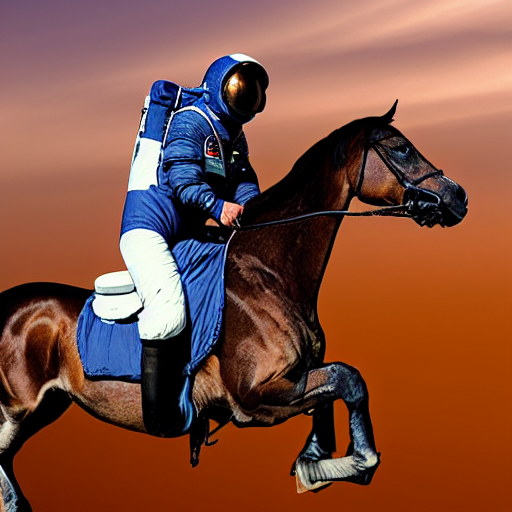

In [41]:
from PIL import Image
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]
pil_images[0]